# Trip Duration Prediction in Bike Sharing Systems

1. [Importing Modules](#1)
2. [Reading and Processing Data](#2)
3. [Exploratory Data Analysis](#3)
4. [Coarse-grained station representation formulation](#4)
5. [Predictive Modeling](#5)

#### Importing modules <a class="anchor" name="1"></a>


In [ ]:
try:
  %matplotlib inline
  import datetime
  import os
  import random
  import matplotlib.pyplot as plt
  import pandas as pd
  import seaborn as sns
  import operator
  import numpy as np
  import geopandas as gp
  %load_ext autoreload
  %autoreload 2
  import networkx as nx
  import community
  from shapely.geometry import Point
  from sklearn import preprocessing, cluster
  import scipy
  import geopy.distance
  
  import folium
  import geopy
  
  from sklearn.preprocessing import LabelEncoder
  import branca
  import branca.colormap as cm
  from sklearn.linear_model import LinearRegression
  from sklearn.ensemble import RandomForestRegressor
  from sklearn.metrics import explained_variance_score, mean_squared_error
  from sklearn.metrics import r2_score
  from tensorflow.keras.models import Sequential
  from tensorflow.keras.layers import Dense
  import tensorflow as tf
  from numpy import loadtxt
  from xgboost import XGBRegressor
  from sklearn.model_selection import train_test_split
  from sklearn.metrics import accuracy_score
  from sklearn.metrics import mean_absolute_error
  from sklearn.ensemble import RandomForestClassifier
  from sklearn import svm
  from sklearn.neighbors import RadiusNeighborsClassifier, KNeighborsClassifier

except ImportError:
  !pip install geopandas==0.8.1 matplotlib==3.2.2 networkx==2.3  numpy==1.18.5  pandas==1.0.5  seaborn==0.10.1
  os.kill(os.getpid(), 9)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


<hr>

#### Reading and Processing Data: <a class="anchor" name="2"></a>

* Bike Trips data - Used 2019 NYC CitiBikes data for the month of December alone due to compute constraints.
* Points of Interests data

In [ ]:
def read(path):
  return pd.read_csv(path)

In [ ]:
PATH_DATA = "/content/drive/MyDrive/UrbanComp/merged_1_mo.csv" #/content/drive/MyDrive/UrbanComp/Project/Data/NYC/Bike-NYC.csv"
PATH_POI = "/content/drive/MyDrive/UrbanComp/Point_Of_Interest.csv"
df = read(PATH_DATA)
df_poi = read(PATH_POI)

In [ ]:
df_poi = df_poi[df_poi.FACILITY_T.isin([1,2,4,6,7,10])]

In [ ]:
long, lat = list(zip(*list(map(lambda x: x[7:-2].split(" "), df_poi.the_geom.to_list()))))

In [ ]:
df_poi["Lat"] = lat
df_poi["Long"] = long
df_poi.Lat = df_poi.Lat.astype(np.float64)
df_poi.Long = df_poi.Long.astype(np.float64)

In [ ]:
df_poi.head()

,COMPLEXID,SEGMENTID,the_geom,SAFTYPE,SOS,PLACEID,FACI_DOM,BIN,BOROUGH,CREATED,MODIFIED,FACILITY_T,SOURCE,B7SC,PRI_ADD,NAME,Lat,Long
0,0,31895,POINT (-74.00701717096757 40.72463475783338),N,1.0,567,9,0,1.0,05/14/2009 12:00:00 AM +0000,11/18/2011 12:00:00 AM +0000,6,DoITT,19743001.0,0,HOLLAND,40.724635,-74.007017
1,3378,306303,POINT (-73.82661642130311 40.797182526598476),N,2.0,568,8,0,4.0,05/14/2009 12:00:00 AM +0000,01/09/2017 12:00:00 AM +0000,6,DoITT,49731001.0,0,WHITESTONE,40.797183,-73.826616
2,3960,144842,POINT (-73.99395441100663 40.703847072357554),N,2.0,576,8,0,3.0,05/14/2009 12:00:00 AM +0000,01/22/2018 12:00:00 AM +0000,6,DoITT,39734001.0,0,BROOKLYN,40.703847,-73.993954
3,0,162664,POINT (-73.9919414213091 40.70960010711741),N,1.0,580,8,0,1.0,05/14/2009 12:00:00 AM +0000,05/11/2011 12:00:00 AM +0000,6,DoITT,19795001.0,0,MANHATTAN,40.709600,-73.991941
4,0,157362,POINT (-73.9526609766105 40.7390660224974),N,1.0,582,8,0,3.0,05/14/2009 12:00:00 AM +0000,03/03/2017 12:00:00 AM +0000,6,DoITT,39740001.0,0,PULASKI,40.739066,-73.952661


In [ ]:
df_poi.shape

(14229, 18)

##### Selecting POI categories for the experiment
The [POI dataset](https://data.cityofnewyork.us/City-Government/Points-Of-Interest/rxuy-2muj) has a wide array of categories as shown below. Six of them are chosen for this experiment.

In [ ]:
o = """1 = Residential
2 = Education Facility
3 = Cultural Facility
4 = Recreational Facility
5 = Social Services
6 = Transportation Facility
7 = Commercial
8 = Government Facility (non public safety)
9 = Religious Institution
10 = Health Services
11 = Public Safety
12 = Water
13 = Miscellaneous"""
bin = dict(map(lambda x: (int(x.split(" = ")[0]), x.split(" = ")[1]), o.split("\n")))
bin
cats = [1,2,4,6,7,10]

##### Stations data preprocessing

In [ ]:
#Function for preparation of stations data
def make_stations(df):
  s = list(zip(df["start station id"].to_list(), df["start station latitude"].to_list(), df["start station longitude"].to_list()))
  e = list(zip(df["end station id"].to_list(), df["end station latitude"].to_list(), df["end station longitude"].to_list()))
  stations = list(set(s+e))
  stations.sort(key=lambda x: x[0])
  stations_df = pd.DataFrame(stations)
  stations_df.columns = ["ID", "Lat", "Long"]
  stations_df = stations_df.drop_duplicates(subset=["ID"])

  df_indegree = pd.DataFrame({"count": df.groupby("end station id").size()}).reset_index()
  df_indegree.columns = ["ID", "count"]

  df_outdegree = pd.DataFrame({"count": df.groupby("start station id").size()}).reset_index()
  df_outdegree.columns = ["ID", "count"]
  stations_df = stations_df.join(df_indegree.set_index("ID"), on="ID", rsuffix="right", ).fillna(0)
  stations_df = stations_df.join(df_outdegree.set_index("ID"), on="ID", rsuffix="_out").fillna(0)

  return stations_df

In [ ]:
stations_df = make_stations(df)

In [ ]:
stations_df.head()

,ID,Lat,Long,count,count_out
0,72,40.767272,-73.993929,2680,2612.0
1,79,40.719116,-74.006667,1243,1202.0
2,82,40.711174,-74.000165,730,703.0
3,83,40.683826,-73.976323,1054,955.0
4,116,40.741776,-74.001497,3497,3494.0


`count` is the total count of trips ending at a given stations represneted by its ID `id` and `count_out` is the total count of trips beginning at `id`. This can be visualized as a eighted directed graphs, with nodes being the stsations (`id`) and an edge from stations `a` to stations `b` if at least one trip from `a` to `b` was made. The weight would be number of trips.

`count` would be the sum of weights of incoming edges and `count_out` would be the sum of weights of all outgoing edges for a given station.

In [ ]:
df_weighted = pd.DataFrame({'weight' : df.groupby(["start station id", "end station id"]).size()}).reset_index()
df_weighted.head()
G=nx.from_pandas_edgelist(df_weighted, 'start station id', 'end station id', create_using=nx.DiGraph())

In [ ]:
df[df["start station id"]==df["end station id"]].shape
df.shape

(955210, 15)

In [ ]:
stations_df.head()

,ID,Lat,Long,count,count_out
0,72,40.767272,-73.993929,2680,2612.0
1,79,40.719116,-74.006667,1243,1202.0
2,82,40.711174,-74.000165,730,703.0
3,83,40.683826,-73.976323,1054,955.0
4,116,40.741776,-74.001497,3497,3494.0


<hr>

## Exploratory Data Analysis <a class="anchor" name="3"></a>


In [ ]:
# function for map plotting

import random

#Function for plotting graph using Folium
def plots(dtf, x, y, color=None, carr=None, ind = None, bin = None, size=None, gradient=None):
  global colors
  data = dtf.copy()
  city = "New York"

  ## get location
  locator = geopy.geocoders.Nominatim(user_agent="MyCoder")
  location = locator.geocode(city)

  location_lat = (max(list(data[x])) + min(list(data[x])))/2
  location_long = (max(list(data[y])) + min(list(data[y])))/2

  ## keep latitude and longitude only
  location = [location_lat, location_long]

  map_ = folium.Map(location=location, 
                    tiles="cartodbpositron", 
                    zoom_start=13)
  hdpd = data
  l = list(map(str, range(10)))+ list("ACCDEF")
  if color:
    colors = carr if carr!=None else ["#"+"".join(random.sample(l, 6)) for i in range(np.unique(dtf[color]).shape[0])]
    print(colors)

  if gradient:
    min_count = gradient[0] #min(list(data["count"]))
    max_count = gradient[1] #max(list(data["count"]))

    colorMap = cm.LinearColormap(colors=['pink','purple'], index=[min_count, max_count],vmin=min_count,vmax=max_count)

    hdpd.apply(lambda row: folium.CircleMarker(
      location=[row[x],row[y]],
      color=colorMap(row[color]), 
      radius=1, 
      fill=False).add_to(map_), 
        axis=1)
    
    map_.add_child(colorMap)
    
  else:
    if color==None:
      print(size)
      hdpd.apply(lambda row: folium.CircleMarker(
            location=[row[x],row[y]],
            color="green",
            radius=(1 if size==None else row[size]), 
            fill=False).add_to(map_), 
              axis=1)
    else:
      hdpd.apply(lambda row: folium.CircleMarker(
            location=[row[x],row[y]],
            color=colors[ind.index(int(row[color]))], 
            radius=1, 
            fill=False).add_to(map_), 
              axis=1)
  
      legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>TYPE:</b><br>"""
      
      for i in ind:
          legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
          fa-1x" style="color:"""+colors[ind.index(i)]+"""">
          </i>&nbsp;"""+bin[i]+"""<br>"""

      legend_html = legend_html+"""</div>"""

      map_.get_root().html.add_child(folium.Element(legend_html))

  return map_

In [ ]:
getmax = lambda x: (((max(stations_df["count"])//1000)+1)*1000)

#### Plotting stations color graded by their in-degrees (number of incoming edges)

In [ ]:
plots(stations_df, "Lat", "Long", color="count", gradient=(0, getmax(stations_df["count"])))

['#C5EA07', '#190572', '#C1E3D0', '#35E8D1', '#98CA2E', '#534AD2', '#FD732A', '#A8D1C3', '#53C142', '#D7C961', '#C8D715', '#951CCE', '#358C40', '#5703C2', '#7CF02D', '#C78F93', '#97453C', '#3CEC2A', '#CA5792', '#350AFC', '#2ED981', '#45E8AD', '#C2F174', '#C2A49F', '#3F4126', '#D9AE84', '#6CC3F1', '#43A8CE', '#7942A1', '#8654E3', '#9F6740', '#4AD0C2', '#8C9FA5', '#A9F382', '#6CA2F4', '#EC3964', '#F60C14', '#2E0CD7', '#CD16A3', '#9032DF', '#1F53C9', '#C6234F', '#1D28EF', '#605C8D', '#C238F5', '#CCFE14', '#1DC52E', '#C7DA94', '#D35C71', '#51A84F', '#7C2D5A', '#9FCCA2', '#28C9E6', '#DE3CA9', '#C147E3', '#4F25DA', '#52AD86', '#768340', '#154D69', '#649C07', '#F53AC2', '#8F6513', '#A40873', '#1FC5E6', '#C7625D', '#0397EA', '#DC7218', '#C7F6CA', '#60C5D3', '#2EF46C', '#EAF54C', '#13C8C6', '#4D7E3C', '#7825FA', '#38D4FC', '#67DC2F', '#4561CE', '#A296CC', '#C45A6F', '#ADFCC7', '#46AC31', '#647D3F', '#A123C0', '#CE137F', '#E60957', '#0C691C', '#D9218C', '#98074C', '#F68C49', '#E65738', '#072C56'

In [ ]:
# stations_df.iloc[np.where(stations_df["count_out"].isna())]

#### Plotting stations color graded by their out-degrees (number of outgoing edges)

In [ ]:
plots(stations_df, "Lat", "Long", color="count_out", gradient=(0, getmax(stations_df["count_out"])))

['#5AE6F0', '#2D3A57', '#D981C7', '#45A167', '#D13E6C', '#CDEA4F', '#98AF63', '#F76C51', '#9DEFC8', '#3C8E70', '#27A35F', '#9CD3E7', '#DC94E8', '#51C3D2', '#4EF726', '#ACF961', '#D63CE1', '#5A9640', '#71FE93', '#AC03CF', '#4E32F6', '#D82F3A', '#70DE48', '#4CC9F6', '#20E418', '#49E817', '#EA254C', '#DF987A', '#35FD84', '#CFE049', '#4E6A89', '#C3E470', '#3ACD25', '#A94CD5', '#4ED76A', '#09F48C', '#FA7241', '#360F4C', '#EFCC27', '#AE8963', '#4DC9A2', '#90CE6D', '#529173', '#6D09C1', '#0E6D84', '#CAD301', '#7D6045', '#A019CE', '#7A9185', '#C8DF17', '#DE6417', '#CA987E', '#263C84', '#0346E8', '#063A5E', '#D72FE1', '#9C2EFD', '#356EDC', '#9607DC', '#40DE87', '#0CD127', '#7F1DC6', '#635AC2', '#F71E64', '#3AD02C', '#30CD6A', '#C379A1', '#0F617A', '#5D1C28', '#247850', '#CC2F68', '#4291C8', '#85A4CF', '#C4CF85', '#97D0E4', '#ED7412', '#C3A0F1', '#2945FA', '#92E1C3', '#CFC173', '#CFA862', '#7A8C21', '#13926C', '#F856DC', '#21E958', '#F3C49E', '#F0CCE3', '#71C209', '#EFC4C1', '#725C6E', '#12C94A'

#### Distance computation between station - Understanding the distribution of stations in terms of their inter-station distance

Haversine distance is used for computing distance bewteen any two stations

In [ ]:
!pip install haversine
import haversine as hs

In [ ]:
stations_by_id = stations_df.set_index("ID")
stations_by_id.head()

,Lat,Long,count,count_out,cluster,centroids,category
ID,,,,,,,
72,40.767272,-73.993929,2680,2612.0,16,0,3
79,40.719116,-74.006667,1243,1202.0,7,0,0
82,40.711174,-74.000165,730,703.0,7,0,0
83,40.683826,-73.976323,1054,955.0,20,0,4
116,40.741776,-74.001497,3497,3494.0,21,0,1


Computing the nearest neightbor distance of each station

In [ ]:
mini = 10^5
maxi = 0
l = []
for i in station_ids.ID:
  mini = 10^5
  maxi = 0
  loc1 = (stations_by_id.loc[i].Lat, stations_by_id.loc[i].Long)
  for j in station_ids.ID:
    if i==j:
      continue
    loc2 = (stations_by_id.loc[j].Lat, stations_by_id.loc[j].Long)
    dist = hs.haversine(loc1,loc2)
    mini = min(dist, mini)
    maxi = max(dist, maxi)
  l.append(mini)

In [ ]:
print("Mean nearest station: %f"%(sum(l)/len(l)))

Mean nearest station: 0.231468


In [ ]:
print("Largest 5 nearest station distances: %s"%(sorted(l, reverse=True))[:5])

Largest 5 nearest station distances: [4.347569872053343, 0.48608086390511995, 0.47929125487853746, 0.4586700334816814, 0.4568193955570464]


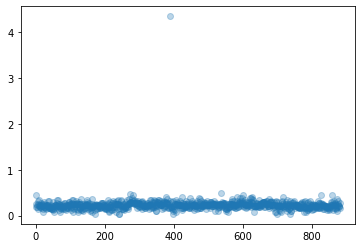

In [ ]:
plt.scatter(range(len(l)), l, alpha=0.3)

A distance of 4.34 kms is taken as an outlier since every other point is seen to have its closest neighbour station at < 500 meters (Y axis is in kilometers). THis is evidenced by the above scatterplot

<hr>

## Coarse-grained station representation formulation <a class="anchor" name="4"></a>

<!-- Stations have a fine-grained representation in terms of theor stsations IDs `id`. A coarse-grained feature representation is expertimented upon. 

Stations can be put into coarse-grained buckets that representative enough of the individual stations. To this end, in this experiment, a station is represented using its -->
The average distance between a station and its nearest neighbor is ∼ 230 meters. Hence, the usage patterns and trends would be very similar for multiple stations. This calls for a possibility of problem simplification, where multiple nodes in the network could come under the same bucket. Hence, two kinds of problem simplification strategies are employed - Geographic positional clustering and Purpose-aware Categorization.

### Clustering stations based on geographical location:
K-Means clustering is used to bring neighboring stations together. `k` value 25 is used.

In [ ]:
# from sklearn import preprocessing, cluster
# import scipy

k = 25
model = cluster.KMeans(n_clusters=k, init='k-means++')
X = stations_df[["Long","Lat"]]
## clustering
stations_df_X = X.copy()
stations_df_X["cluster"] = model.fit_predict(X)
## find real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     stations_df_X.drop("cluster", axis=1).values)
stations_df_X["centroids"] = 0
for i in closest:
    stations_df_X["centroids"].iloc[i] = 1
## add clustering info to the original dataset
stations_df[["cluster","centroids"]] = stations_df_X[["cluster","centroids"]]
stations_df.sample(5)

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


,ID,Lat,Long,count,count_out,cluster,centroids
39,245,40.693270,-73.977039,420,419.0,20,0
370,3109,40.726060,-73.956210,781,770.0,6,0
291,532,40.710451,-73.960876,1553,1601.0,18,0
727,3613,40.745038,-73.957539,272,256.0,9,0
884,3853,40.706860,-73.928510,63,50.0,10,0


In [ ]:
clusters = sorted(list(np.unique(stations_df["cluster"])))
clus_dict = dict(zip(clusters, list(map(str,clusters))))
plots(stations_df, "Lat", "Long", color="cluster", ind = clusters, bin = clus_dict)

['#E82607', '#0CE27F', '#0F1C25', '#275A4E', '#FD2041', '#2C51C9', '#9308D2', '#371ECC', '#C27E9C', '#E1DC0F', '#485309', '#3DAC02', '#9F3C71', '#197083', '#C1FDE8', '#1CED07', '#CC071A', '#368A01', '#C70D35', '#583964', '#EC47F9', '#F7E814', '#720DFA', '#ECCF94', '#C74D13']


### Purpose-aware Categorization (POI-aware clustering)

Each bike station is assumed to serve a specific purpose based on its surroundings, or technically speaking, its context. This makes sense because a station‘s usage is heavily dependent on what is around it. The kind of incoming and outgoing users and their trips are heavily governed by its location. A user would likely check in to (drop off the bicycle at) a station which is closest to their destination. Given the dense spread of the bike sharing stations, it is very unlikely for a user to stop at one station and walk miles to get to their purported destination when there is a bike station much closer to their destination. Hence, the main purpose of a station can be determined by what is very close to it, and a context-aware clustering or categorizing of each of the stations based on the surroundings is employed.


In [ ]:
max_la, min_la, max_lo, min_lo = max(stations_df.Lat), min(stations_df.Lat), max(stations_df.Long), min(stations_df.Long)
max_la, min_la, max_lo, min_lo

(40.818298999999996, 40.65539977447831, -73.89795, -74.06391263008119)

In [ ]:
df_poi = df_poi[(df_poi.Lat>=min_la) & (df_poi.Lat<=max_la) & (df_poi.Long>=min_lo) & (df_poi.Long<=max_lo)]

#### Plot of POIs across various boroughs of New York City

In [ ]:
plots(df_poi, "Lat", "Long", color="FACILITY_T", ind=cats, bin=bin, carr=['#E9D075', '#81D4A2', '#4E1A25', '#62D7E3', '#6754CA', '#2CFA4C'])

['#E9D075', '#81D4A2', '#4E1A25', '#62D7E3', '#6754CA', '#2CFA4C']


In [ ]:
category_colors = colors

#### Implementing Purpose-aware Categorization (PaC):
The POIs are superimposed with the stations network, and each station is
categorized based on what it is surrounded by. “Radial Nearest Neighbors” is employed to capture the POIs that surround a given station within a predetermined radius 𝜃. Finally, a maximum vote is taken to categorize the main purpose of the station.

Given the dense nature of the network, it is assumed that an average user would consider an “after cycling” commute of one block. Since the standard block length in Manhattan is 274 meters, we take the radius of 300 meters, which is close to one block length.

In [ ]:
# import geopy.distance
distance_in_meters = lambda x, y: geopy.distance.vincenty(x, y).meters

In [ ]:
# from sklearn.neighbors import RadiusNeighborsClassifier, KNeighborsClassifier
clf = RadiusNeighborsClassifier(radius=300, metric=distance_in_meters, outlier_label=6)
clf.fit(df_poi.loc[:,["Lat", "Long"]], df_poi.FACILITY_T)

RadiusNeighborsClassifier(metric=<function <lambda> at 0x7f4157c9b050>,
                          outlier_label=6, radius=300)

In [ ]:
category = clf.predict(stations_df.loc[:,["Lat","Long"]])

In [ ]:
stations_df["category"] = category

In [ ]:
stations_df.head()

,ID,Lat,Long,count,count_out,cluster,centroids,category
0,72,40.767272,-73.993929,2680,2612.0,16,0,6
1,79,40.719116,-74.006667,1243,1202.0,7,0,1
2,82,40.711174,-74.000165,730,703.0,7,0,1
3,83,40.683826,-73.976323,1054,955.0,20,0,7
4,116,40.741776,-74.001497,3497,3494.0,21,0,2


In [ ]:
category_colors = ['#E9D075', '#81D4A2', '#4E1A25', '#62D7E3', '#6754CA', '#2CFA4C']

###### Result of PaC:

In [ ]:
plots(stations_df, "Lat", "Long", color="category", ind=cats, bin=bin, carr = category_colors)

['#E9D075', '#81D4A2', '#4E1A25', '#62D7E3', '#6754CA', '#2CFA4C']


<hr>

## Predictive Modelling: <a class="anchor" name="5"></a>

Modeling is done in three settings:
* Station information simplified to tuple `(geographic location (cluster), purpose (from PaC))` for pick up station only - [Setting M1](#m1)
* Station information simplified to tuple `(geographic location (cluster), purpose (from PaC))` for pick up and destination stations - [Setting M2](#m2)
* Station information for pick up station only with no simplification; Each station would just be indicated using its `id` - [Setting M3](#m3)


In [ ]:
data = df.loc[:, ["start station id", "starttime", "usertype", "gender", "tripduration", ]]

In [ ]:
data.rename({"start station id":"start_id", "end station id":"end_id"})

,start station id,starttime,usertype,gender,tripduration
0,3382,2019-12-01 00:00:05.5640,Subscriber,1,602
1,362,2019-12-01 00:00:10.9630,Customer,1,1206
2,146,2019-12-01 00:00:11.8180,Subscriber,1,723
3,3834,2019-12-01 00:00:12.2200,Customer,1,404
4,500,2019-12-01 00:00:14.7230,Subscriber,1,1059
...,...,...,...,...,...
955205,3141,2019-12-31 23:58:18.0160,Subscriber,2,93
955206,490,2019-12-31 23:58:59.8960,Subscriber,1,786
955207,3349,2019-12-31 23:59:03.6950,Subscriber,2,351
955208,252,2019-12-31 23:59:21.3610,Subscriber,1,1571


In [ ]:
# from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["usertype"] = le.fit_transform(data.usertype)
stations_df["category"] = le.fit_transform(stations_df.category)

In [ ]:
station_ids = stations_df.loc[:, ["ID", "category", "cluster"]].drop_duplicates()
np.where(data.duplicated())

(array([], dtype=int64),)

### M1 - Trip Prediction with only pickup (check-out) information <a class="anchor" name="m1"></a>

In [ ]:
data.shape

(955210, 5)

In [ ]:
data_final = pd.merge(
    data,
    station_ids,
    how="left",
    on=None,
    left_on="start station id",
    right_on="ID",
    left_index=False,
    right_index=False,
    sort=False,
    suffixes=("_x", "_y"),
    copy=True,
    indicator=False,
    validate=None,
).drop(["ID", "start station id"], axis=1)
data_final = data_final.rename(columns={"category":"start_category"})
data_final.shape

(955210, 6)

In [ ]:
data_final.head()

,starttime,usertype,gender,tripduration,start_category,cluster
0,2019-12-01 00:00:05.5640,1,1,602,1,22
1,2019-12-01 00:00:10.9630,0,1,1206,4,16
2,2019-12-01 00:00:11.8180,1,1,723,1,7
3,2019-12-01 00:00:12.2200,0,1,404,1,3
4,2019-12-01 00:00:14.7230,1,1,1059,4,16


In [ ]:
data_final["starttime"] = pd.to_datetime(data_final["starttime"])

In [ ]:
# import datetime
data_final["hour"] = data_final["starttime"].apply(lambda x: x.hour)
data_final["minute"] = data_final["starttime"].apply(lambda x: x.minute)
data_final["is_weekdend"] = data_final["starttime"].apply(lambda x: int(x.isoweekday() in [6,7]))

In [ ]:
data_final.drop("starttime", axis=1, inplace=True)

#### Correlation plot bewteen X variables and Y (tripduration)
There is barely any linear relation between any of the X attributes and the Y variable `tripduration`). On the other hand, a simple logarithmic transformation increases linear correlation with X. 

Variable `tripduration_log` is hence used as the dependet/response variable.

In [ ]:
data_final["tripduration_log"] = np.log(data_final.tripduration)

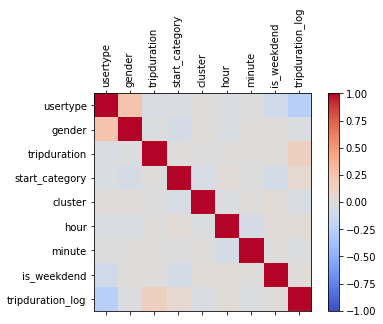

In [ ]:
corr = data_final.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(data_final.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(data_final.columns)
ax.set_yticklabels(data_final.columns)
plt.show()

In [ ]:
data_final["tripduration_minutes"] = data_final.tripduration/60

In [ ]:
data_final.head()

,usertype,gender,tripduration,start_category,cluster,hour,minute,is_weekdend,tripduration_log,tripduration_minutes
0,1,1,602,1,22,0,0,1,6.400257,10.033333
1,0,1,1206,4,16,0,0,1,7.095064,20.100000
2,1,1,723,1,7,0,0,1,6.583409,12.050000
3,0,1,404,1,3,0,0,1,6.001415,6.733333
4,1,1,1059,4,16,0,0,1,6.965080,17.650000


In [ ]:
data_final = data_final.rename(columns = {"start station id": "start_id", "end station id": "end_id"})
data_final.head()

,usertype,gender,tripduration,start_category,cluster,hour,minute,is_weekdend,tripduration_log,tripduration_minutes
0,1,1,602,1,22,0,0,1,6.400257,10.033333
1,0,1,1206,4,16,0,0,1,7.095064,20.100000
2,1,1,723,1,7,0,0,1,6.583409,12.050000
3,0,1,404,1,3,0,0,1,6.001415,6.733333
4,1,1,1059,4,16,0,0,1,6.965080,17.650000


Adjusted R2 metric for evaluation

In [ ]:
def adj_r2(y, yhat, X):
  SS_Residual = sum((y-yhat)**2)   
  SS_Total = sum((y-np.mean(y))**2)
  r_squared = 1 - (float(SS_Residual)/SS_Total)
  adjusted_r_squared = 1-((1-r_squared)*(len(y)-1)/(len(y)-X-1))
  return adjusted_r_squared
  # 0.877643371323 0.863248473832

In [ ]:
def rf_train(X_train, y_train):
  rf_reg = RandomForestRegressor(n_estimators=250, random_state = 100, verbose=2)
  model_reg = rf_reg.fit(X_train, y_train)
  return model_reg

In [ ]:
def xgb_train(X_train, y_train):
  xg = XGBRegressor()
  model_xg = xg.fit(X_train, y_train)
  return model_xg

In [ ]:
def lr_train(X_train, y_train):
  lr = LinearRegression()
  model_lr = lr.fit(X_train, y_train)
  return model_lr

In [ ]:
def R2_err(y_true, y_pred):
    from keras import backend as K
    SS_res =  K.sum(K.square( y_true-y_pred ))
    SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) )
    return ( 1 - SS_res/(SS_tot + K.epsilon()) )

def ann_train(X_train, y_train):
  model = Sequential()
  model.add(Dense(5, input_shape=(X_train.shape[1],), activation='relu'))
  model.add(Dense(10, activation='relu'))
  model.add(Dense(1, activation='relu'))

  # Configure the model and start training
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=["mean_squared_error", R2_err])
  model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1, validation_split=0.2)
  return model

In [ ]:
# from sklearn.ensemble import RandomForestRegressor
yvars = ["tripduration_minutes", "tripduration", "tripduration_log"]

In [ ]:
def prep_train_test(data_final, yvars, index):
  X = data_final.loc[:, [i for i in data_final if i not in yvars]]
  y = data_final[yvars[index]]
  return train_test_split(X, y, test_size=0.8, random_state=100)

In [ ]:
def eval(y_test, y_pred, X):
  print("Mean Squared Error: %.3f\nAdjusted R2 Score: %.3f"%(mean_squared_error(y_test, y_pred), adj_r2(y_test, y_pred, X)))

In [ ]:
X_train, X_test, y_train, y_test = prep_train_test(data_final, yvars, 2)

#### Random Forest Regression

In [ ]:
rf_src = rf_train(X_train, y_train)
# model_reg = rf_reg.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 250


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


building tree 2 of 250
building tree 3 of 250
building tree 4 of 250
building tree 5 of 250
building tree 6 of 250
building tree 7 of 250
building tree 8 of 250
building tree 9 of 250
building tree 10 of 250
building tree 11 of 250
building tree 12 of 250
building tree 13 of 250
building tree 14 of 250
building tree 15 of 250
building tree 16 of 250
building tree 17 of 250
building tree 18 of 250
building tree 19 of 250
building tree 20 of 250
building tree 21 of 250
building tree 22 of 250
building tree 23 of 250
building tree 24 of 250
building tree 25 of 250
building tree 26 of 250
building tree 27 of 250
building tree 28 of 250
building tree 29 of 250
building tree 30 of 250
building tree 31 of 250
building tree 32 of 250
building tree 33 of 250
building tree 34 of 250
building tree 35 of 250
building tree 36 of 250
building tree 37 of 250
building tree 38 of 250
building tree 39 of 250
building tree 40 of 250
building tree 41 of 250
building tree 42 of 250
building tree 43 of 250


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  1.7min finished


In [ ]:
y_pred = rf_src.predict(X_test) #model_reg.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


Mean Squared Error: 0.626
Adjusted R2 Score: -0.098


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  1.3min finished


#### ANN

In [ ]:
ann_src = ann_train(X_train, y_train)

Epoch 1/50
4777/4777 [==============================] - 9s 2ms/step - loss: 1.0990 - mean_squared_error: 1.0990 - R2_err: -100.6623 - val_loss: 0.6044 - val_mean_squared_error: 0.6044 - val_R2_err: -132.7345
Epoch 2/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.5597 - mean_squared_error: 0.5597 - R2_err: -175.5778 - val_loss: 0.5587 - val_mean_squared_error: 0.5587 - val_R2_err: -1336.4875
Epoch 3/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.5456 - mean_squared_error: 0.5456 - R2_err: -267.5259 - val_loss: 0.5656 - val_mean_squared_error: 0.5656 - val_R2_err: -4.8392
Epoch 4/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.5414 - mean_squared_error: 0.5414 - R2_err: -2401.4678 - val_loss: 0.5537 - val_mean_squared_error: 0.5537 - val_R2_err: -29.8871
Epoch 5/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.5412 - mean_squared_error: 0.5412 - R2_err: -1008.9022 - val_loss: 0.5715 - val_mean_square

In [ ]:
y_pred = ann_src.predict(X_test)
eval(y_test, y_pred.flatten(), X_train.shape[1])
# y_pred = y_pred.flatten()
# print(mean_squared_error(y_test, y_pred), explained_variance_score(y_test, y_pred))

Mean Squared Error: 0.533
Adjusted R2 Score: 0.066


#### XGBoost

In [ ]:
xg_src = xgb_train(X_train, y_train)

[05:27:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
y_pred = xg_src.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])

Mean Squared Error: 0.519
Adjusted R2 Score: 0.090


#### Linear Regression

In [ ]:
lr_src = lr_train(X_train, y_train)

In [ ]:
# lr = LinearRegression()
# model_lr = lr.fit(X_train, y_train)
y_pred = lr_src.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])
#print(mean_squared_error(y_test, y_pred), explained_variance_score(y_test, y_pred))

Mean Squared Error: 0.533
Adjusted R2 Score: 0.066


In [ ]:
# adj_r2(y_test, y_pred, X_train)

### M2 -  Trip Prediction with destination information <a class="anchor" name="m2"></a>

#### Data prep

In [ ]:
data = df.loc[:, ["start station id", "starttime", "end station id", "usertype", "gender", "tripduration"]]

In [ ]:
data.rename({"start station id":"start_id", "end station id":"end_id"})

,start station id,starttime,end station id,usertype,gender,tripduration
0,3382,2019-12-01 00:00:05.5640,3304,Subscriber,1,602
1,362,2019-12-01 00:00:10.9630,500,Customer,1,1206
2,146,2019-12-01 00:00:11.8180,238,Subscriber,1,723
3,3834,2019-12-01 00:00:12.2200,3827,Customer,1,404
4,500,2019-12-01 00:00:14.7230,3323,Subscriber,1,1059
...,...,...,...,...,...,...
955205,3141,2019-12-31 23:58:18.0160,3142,Subscriber,2,93
955206,490,2019-12-31 23:58:59.8960,513,Subscriber,1,786
955207,3349,2019-12-31 23:59:03.6950,3368,Subscriber,2,351
955208,252,2019-12-31 23:59:21.3610,366,Subscriber,1,1571


In [ ]:
# from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["usertype"] = le.fit_transform(data.usertype)
stations_df["category"] = le.fit_transform(stations_df.category)

In [ ]:
data.head()

,start station id,starttime,end station id,usertype,gender,tripduration
0,3382,2019-12-01 00:00:05.5640,3304,1,1,602
1,362,2019-12-01 00:00:10.9630,500,0,1,1206
2,146,2019-12-01 00:00:11.8180,238,1,1,723
3,3834,2019-12-01 00:00:12.2200,3827,0,1,404
4,500,2019-12-01 00:00:14.7230,3323,1,1,1059


In [ ]:
data_final = pd.merge(
    data,
    station_ids,
    how="left",
    on=None,
    left_on="start station id",
    right_on="ID",
    left_index=False,
    right_index=False,
    sort=False,
    suffixes=("_x", "_y"),
    copy=True,
    indicator=False,
    validate=None,
).drop(["ID", "start station id"], axis=1)
# data_final = data_final.rename(columns={"category":"start_category"})
data_final.shape

(955210, 7)

In [ ]:
data_final = pd.merge(
    data_final,
    station_ids,
    how="left",
    on=None,
    left_on="end station id",
    right_on="ID",
    left_index=False,
    right_index=False,
    sort=False,
    suffixes=("_start", "_end"),
    copy=True,
    indicator=False,
    validate=None,
).drop(["ID", "end station id"], axis=1)
# data_final = data_final.rename(columns={"end_category":"end_category"})
data_final.shape

(955210, 8)

In [ ]:
# data_final = data

In [ ]:
data_final["starttime"] = pd.to_datetime(data_final["starttime"])

In [ ]:
# import datetime

In [ ]:
data_final["hour"] = data_final["starttime"].apply(lambda x: x.hour)
data_final["minute"] = data_final["starttime"].apply(lambda x: x.minute)
data_final["is_weekdend"] = data_final["starttime"].apply(lambda x: int(x.isoweekday() in [6,7]))

In [ ]:
data_final.drop("starttime", axis=1, inplace=True)

In [ ]:
data_final["tripduration_log"] = np.log(data_final.tripduration)
data_final["tripduration_minutes"] = data_final.tripduration//60

In [ ]:
data_final.head()

,usertype,gender,tripduration,category_start,cluster_start,category_end,cluster_end,hour,minute,is_weekdend,tripduration_log,tripduration_minutes
0,1,1,602,1,22,1,11,0,0,1,6.400257,10
1,0,1,1206,4,16,4,16,0,0,1,7.095064,20
2,1,1,723,1,7,3,21,0,0,1,6.583409,12
3,0,1,404,1,3,2,3,0,0,1,6.001415,6
4,1,1,1059,4,16,2,23,0,0,1,6.965080,17


In [ ]:
X_train, X_test, y_train, y_test = prep_train_test(data_final, yvars, 2)

#### Random Forest Regression

In [ ]:
rf_both = rf_train(X_train, y_train)
# model_reg = rf_reg.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 250


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


building tree 2 of 250
building tree 3 of 250
building tree 4 of 250
building tree 5 of 250
building tree 6 of 250
building tree 7 of 250
building tree 8 of 250
building tree 9 of 250
building tree 10 of 250
building tree 11 of 250
building tree 12 of 250
building tree 13 of 250
building tree 14 of 250
building tree 15 of 250
building tree 16 of 250
building tree 17 of 250
building tree 18 of 250
building tree 19 of 250
building tree 20 of 250
building tree 21 of 250
building tree 22 of 250
building tree 23 of 250
building tree 24 of 250
building tree 25 of 250
building tree 26 of 250
building tree 27 of 250
building tree 28 of 250
building tree 29 of 250
building tree 30 of 250
building tree 31 of 250
building tree 32 of 250
building tree 33 of 250
building tree 34 of 250
building tree 35 of 250
building tree 36 of 250
building tree 37 of 250
building tree 38 of 250
building tree 39 of 250
building tree 40 of 250
building tree 41 of 250
building tree 42 of 250
building tree 43 of 250


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  2.6min finished


In [ ]:
y_pred = rf_both.predict(X_test) #model_reg.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


Mean Squared Error: 0.374
Adjusted R2 Score: 0.343


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  1.6min finished


#### ANN

In [ ]:
ann_both = ann_train(X_train, y_train)

Epoch 1/50
4777/4777 [==============================] - 9s 2ms/step - loss: 1.1077 - mean_squared_error: 1.1077 - R2_err: -278.3909 - val_loss: 0.5174 - val_mean_squared_error: 0.5174 - val_R2_err: -145.0480
Epoch 2/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.5115 - mean_squared_error: 0.5115 - R2_err: -2293.9236 - val_loss: 0.5171 - val_mean_squared_error: 0.5171 - val_R2_err: -381.8390
Epoch 3/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.4966 - mean_squared_error: 0.4966 - R2_err: -815.7737 - val_loss: 0.5106 - val_mean_squared_error: 0.5106 - val_R2_err: -356.3011
Epoch 4/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.4854 - mean_squared_error: 0.4854 - R2_err: -96.5890 - val_loss: 0.4765 - val_mean_squared_error: 0.4765 - val_R2_err: -363.3831
Epoch 5/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.4813 - mean_squared_error: 0.4813 - R2_err: -12.2061 - val_loss: 0.4917 - val_mean_squared

In [ ]:
y_pred = ann_both.predict(X_test)
eval(y_test, y_pred.flatten(), X_train.shape[1])
# y_pred = y_pred.flatten()
# print(mean_squared_error(y_test, y_pred), explained_variance_score(y_test, y_pred))

Mean Squared Error: 0.406
Adjusted R2 Score: 0.288


#### XGBoost

In [ ]:
xg_both = xgb_train(X_train, y_train)

[05:39:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
y_pred = xg_both.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])

Mean Squared Error: 0.433
Adjusted R2 Score: 0.241


#### Linear Regression

In [ ]:
lr_both = lr_train(X_train, y_train)

In [ ]:
# lr = LinearRegression()
# model_lr = lr.fit(X_train, y_train)
y_pred = lr_both.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])
#print(mean_squared_error(y_test, y_pred), explained_variance_score(y_test, y_pred))

Mean Squared Error: 0.531
Adjusted R2 Score: 0.070


### M3 - Trip prediction with stations instead of groupings/clusters <a class="anchor" name="m3"></a>

In [ ]:
data

,start station id,starttime,end station id,usertype,gender,tripduration
0,3382,2019-12-01 00:00:05.5640,3304,1,1,602
1,362,2019-12-01 00:00:10.9630,500,0,1,1206
2,146,2019-12-01 00:00:11.8180,238,1,1,723
3,3834,2019-12-01 00:00:12.2200,3827,0,1,404
4,500,2019-12-01 00:00:14.7230,3323,1,1,1059
...,...,...,...,...,...,...
955205,3141,2019-12-31 23:58:18.0160,3142,1,2,93
955206,490,2019-12-31 23:58:59.8960,513,1,1,786
955207,3349,2019-12-31 23:59:03.6950,3368,1,2,351
955208,252,2019-12-31 23:59:21.3610,366,1,1,1571


In [ ]:
station_ids["encoded id"] = le.fit_transform(station_ids["ID"])

In [ ]:
station_ids.loc[:,["ID", "encoded id"]].head()

,ID,encoded id
0,72,0
1,79,1
2,82,2
3,83,3
4,116,4


In [ ]:
# data_final.head()

In [ ]:
data_final = pd.merge(
    data,
    station_ids.loc[:,["ID", "encoded id"]],
    how="left",
    on=None,
    left_on="start station id",
    right_on="ID",
    left_index=False,
    right_index=False,
    sort=False,
    copy=True,
    indicator=False,
    validate=None,
).drop(["ID", "start station id"], axis=1)
# data_final = data_final.rename(columns={"end_category":"end_category"})
# data_final.shape
# data_final = pd.merge(
#     data_final,
#     station_ids.loc[:,["ID", "encoded id"]],
#     how="left",
#     on=None,
#     left_on="end station id",
#     right_on="ID",
#     left_index=False,
#     right_index=False,
#     sort=False,
#     suffixes=("_start", "_end"),
#     copy=True,
#     indicator=False,
#     validate=None,
# ).drop(["ID", "end station id"], axis=1)
# # data_final = data_final.rename(columns={"end_category":"end_category"})
# data_final.shape

In [ ]:
data_final.head()

,starttime,end station id,usertype,gender,tripduration,encoded id
0,2019-12-01 00:00:05.5640,3304,1,1,602,500
1,2019-12-01 00:00:10.9630,500,0,1,1206,123
2,2019-12-01 00:00:11.8180,238,1,1,723,11
3,2019-12-01 00:00:12.2200,3827,0,1,404,809
4,2019-12-01 00:00:14.7230,3323,1,1,1059,227


In [ ]:
rf_src = None
ann_src = None
lr_src = None
xg_src = None
rf_both = None
ann_both = None
lr_both = None
xg_both = None

In [ ]:
data_final["starttime"] = pd.to_datetime(data_final["starttime"])

In [ ]:
# import datetime
data_final["hour"] = data_final["starttime"].apply(lambda x: x.hour)
data_final["minute"] = data_final["starttime"].apply(lambda x: x.minute)
data_final["is_weekdend"] = data_final["starttime"].apply(lambda x: int(x.isoweekday() in [6,7]))

In [ ]:
data_final.drop("starttime", axis=1, inplace=True)

In [ ]:
data_final["tripduration_log"] = np.log(data_final.tripduration)

In [ ]:
data_final["tripduration_minutes"] = data_final.tripduration/60

In [ ]:
data_final.head()

,end station id,usertype,gender,tripduration,encoded id,hour,minute,is_weekdend,tripduration_log,tripduration_minutes
0,3304,1,1,602,500,0,0,1,6.400257,10.033333
1,500,0,1,1206,123,0,0,1,7.095064,20.100000
2,238,1,1,723,11,0,0,1,6.583409,12.050000
3,3827,0,1,404,809,0,0,1,6.001415,6.733333
4,3323,1,1,1059,227,0,0,1,6.965080,17.650000


In [ ]:
# X = data_final.loc[:, [i for i in data_final if i not in yvars]]
# y = data_final[yvars[2]]

In [ ]:
data_final.drop("end station id", axis=1, inplace=True)

In [ ]:
data_final.head()

,usertype,gender,tripduration,encoded id,hour,minute,is_weekdend,tripduration_log,tripduration_minutes
0,1,1,602,500,0,0,1,6.400257,10.033333
1,0,1,1206,123,0,0,1,7.095064,20.100000
2,1,1,723,11,0,0,1,6.583409,12.050000
3,0,1,404,809,0,0,1,6.001415,6.733333
4,1,1,1059,227,0,0,1,6.965080,17.650000


In [ ]:
X_train, X_test, y_train, y_test = prep_train_test(data_final, yvars, 2)

In [ ]:
X_train.head()

,usertype,gender,encoded id,hour,minute,is_weekdend
438114,1,1,334,9,44,0
306963,1,1,397,8,28,0
60425,1,1,701,18,55,0
694747,1,2,185,13,57,1
861818,1,2,457,20,6,0


#### Random Forest Regression

In [ ]:
rf_stations = rf_train(X_train, y_train)
# model_reg = rf_reg.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 250


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


building tree 2 of 250
building tree 3 of 250
building tree 4 of 250
building tree 5 of 250
building tree 6 of 250
building tree 7 of 250
building tree 8 of 250
building tree 9 of 250
building tree 10 of 250
building tree 11 of 250
building tree 12 of 250
building tree 13 of 250
building tree 14 of 250
building tree 15 of 250
building tree 16 of 250
building tree 17 of 250
building tree 18 of 250
building tree 19 of 250
building tree 20 of 250
building tree 21 of 250
building tree 22 of 250
building tree 23 of 250
building tree 24 of 250
building tree 25 of 250
building tree 26 of 250
building tree 27 of 250
building tree 28 of 250
building tree 29 of 250
building tree 30 of 250
building tree 31 of 250
building tree 32 of 250
building tree 33 of 250
building tree 34 of 250
building tree 35 of 250
building tree 36 of 250
building tree 37 of 250
building tree 38 of 250
building tree 39 of 250
building tree 40 of 250
building tree 41 of 250
building tree 42 of 250
building tree 43 of 250


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  2.4min finished


In [ ]:
y_pred = rf_stations.predict(X_test) #model_reg.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


Mean Squared Error: 0.583
Adjusted R2 Score: -0.022


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  1.8min finished


#### ANN

In [ ]:
ann_stations = ann_train(X_train, y_train)

Epoch 1/50
4777/4777 [==============================] - 9s 2ms/step - loss: 1.6653 - mean_squared_error: 1.6653 - R2_err: -1560.8718 - val_loss: 0.5879 - val_mean_squared_error: 0.5879 - val_R2_err: -647.5817
Epoch 2/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.6436 - mean_squared_error: 0.6436 - R2_err: -38.0072 - val_loss: 0.5396 - val_mean_squared_error: 0.5396 - val_R2_err: -588.7768
Epoch 3/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.6241 - mean_squared_error: 0.6241 - R2_err: -117.2835 - val_loss: 1.1730 - val_mean_squared_error: 1.1730 - val_R2_err: -633.1661
Epoch 4/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.6244 - mean_squared_error: 0.6244 - R2_err: -79.5479 - val_loss: 0.6487 - val_mean_squared_error: 0.6487 - val_R2_err: -1656.0991
Epoch 5/50
4777/4777 [==============================] - 8s 2ms/step - loss: 0.6065 - mean_squared_error: 0.6065 - R2_err: -1075.2069 - val_loss: 0.7491 - val_mean_squar

In [ ]:
y_pred = ann_stations.predict(X_test)
eval(y_test, y_pred.flatten(), X_train.shape[1])
# y_pred = y_pred.flatten()
# print(mean_squared_error(y_test, y_pred), explained_variance_score(y_test, y_pred))

Mean Squared Error: 0.535
Adjusted R2 Score: 0.063


#### XGBoost

In [ ]:
xg_stations = xgb_train(X_train, y_train)

[06:03:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
y_pred = xg_stations.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])

Mean Squared Error: 0.523
Adjusted R2 Score: 0.082


#### Linear Regression

In [ ]:
lr_stations = lr_train(X_train, y_train)

In [ ]:
# lr = LinearRegression()
# model_lr = lr.fit(X_train, y_train)
y_pred = lr_stations.predict(X_test)
eval(y_test, y_pred, X_train.shape[1])
#print(mean_squared_error(y_test, y_pred), explained_variance_score(y_test, y_pred))

Mean Squared Error: 0.535
Adjusted R2 Score: 0.062
